# 1 voy a definir lo que quiero descubrir: 
*qué pelis fueron màs populares en cada año
*què actor/actriz hizo màs peliculas

# 2 en funcion al negocio:
*què gènero es màs popular
*correlacion popularidad y retorno
*hay relacion entre actores/actrices y popularidad
*que relacion hay entre puntaje y popularidad
*que relacion hay entre puntaje y retorno 
*que relacion hay entre puntaje y fecha de estreno, en que fechas (meses) se genera mayor retorno?

# 3 La nube de palabras.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("../dataset/df_completo.csv")

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\2354131906.py:1: DtypeWarning: Columns (4,16,17,18,19,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../dataset/df_completo.csv")


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45379 entries, 0 to 45378
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 45379 non-null  int64  
 1   budget                     45379 non-null  float64
 2   id                         45379 non-null  object 
 3   overview                   44438 non-null  object 
 4   popularity                 45377 non-null  object 
 5   release_date               45376 non-null  object 
 6   revenue                    45379 non-null  float64
 7   runtime                    45130 non-null  float64
 8   status                     45296 non-null  object 
 9   tagline                    20398 non-null  object 
 10  title                      45376 non-null  object 
 11  vote_average               45376 non-null  float64
 12  vote_count                 45376 non-null  float64
 13  release_year               45376 non-null  flo

In [4]:
print(data.describe())
print(data.info())
print(data.isnull().sum())


         Unnamed: 0        budget       revenue       runtime  vote_average  \
count  45379.000000  4.537900e+04  4.537900e+04  45130.000000  45376.000000   
mean   22715.407854  4.232325e+06  1.122936e+07     94.181675      5.624070   
std    13121.525999  1.743932e+07  6.438789e+07     38.341059      1.915423   
min        0.000000  0.000000e+00  0.000000e+00      0.000000      0.000000   
25%    11349.500000  0.000000e+00  0.000000e+00     85.000000      5.000000   
50%    22714.000000  0.000000e+00  0.000000e+00     95.000000      6.000000   
75%    34072.500000  0.000000e+00  0.000000e+00    107.000000      6.800000   
max    45465.000000  3.800000e+08  2.787965e+09   1256.000000     10.000000   

         vote_count  release_year        return         index            ID  
count  45376.000000  45376.000000  4.537900e+04  29969.000000  29969.000000  
mean     110.096439   1991.881193  6.599991e+02  15009.586473  14996.785478  
std      491.742894     24.055360  7.469083e+04   8671

In [5]:
data.head(1)

,Unnamed: 0,budget,id,overview,popularity,release_date,revenue,runtime,status,tagline,...,return,index,Main_spoken_languages,belongs_to_collection.3.1,genres 1,genres 2,genres 3,Cast,Directed by,ID
0,0,30000000.0,862,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,NaN,...,12.451801,0.0,'English','Toy Story Collection','Animation','Comedy','Family',"Tom Hanks, Tim Allen, Don Rickles, Jim Varney",John Lasseter,0.0


ID y index eran para guiarme cuando hice la concatenación de los subgrupos de dataset, voy a borrarlos.

In [6]:
data.drop(["Unnamed: 0", "ID", "index"], axis=1, inplace=True)


El status "released" no es útil

In [7]:
data.drop(["status"], axis=1, inplace=True)

In [8]:
cols = list(data.columns)
cols.insert(0, cols.pop(1))
data = data[cols]

In [9]:
data.columns


Index(['id', 'budget', 'overview', 'popularity', 'release_date', 'revenue',
       'runtime', 'tagline', 'title', 'vote_average', 'vote_count',
       'release_year', 'return', 'Main_spoken_languages',
       'belongs_to_collection.3.1', 'genres 1', 'genres 2', 'genres 3', 'Cast',
       'Directed by'],
      dtype='object')

In [10]:
# Comprobar los valores nulos
print(data.isnull().sum())

id                               0
budget                           0
overview                       941
popularity                       2
release_date                     3
revenue                          0
runtime                        249
tagline                      24981
title                            3
vote_average                     3
vote_count                       3
release_year                     3
return                           0
Main_spoken_languages        17313
belongs_to_collection.3.1    15410
genres 1                     15410
genres 2                     15410
genres 3                     15410
Cast                         15410
Directed by                  15753
dtype: int64


Hay una cohincidencia entre los valores nulos desde belongs to collection en adelante, eso es una consecuencia de desanidar con power BI, como no podìa exportar màs de 30 mil filas, esas quedaron NAN.

In [11]:
#voy a eliminar las películas que no estan en ingles o español, como criterio de filtro.
data=data.truncate(before= 0, after=30001)

In [12]:
print(data.isnull().sum())

id                               0
budget                           0
overview                       325
popularity                       2
release_date                     2
revenue                          0
runtime                         76
tagline                      14108
title                            2
vote_average                     2
vote_count                       2
release_year                     2
return                           0
Main_spoken_languages         1936
belongs_to_collection.3.1       33
genres 1                        33
genres 2                        33
genres 3                        33
Cast                            33
Directed by                    376
dtype: int64


In [13]:
#data["title"].duplicated

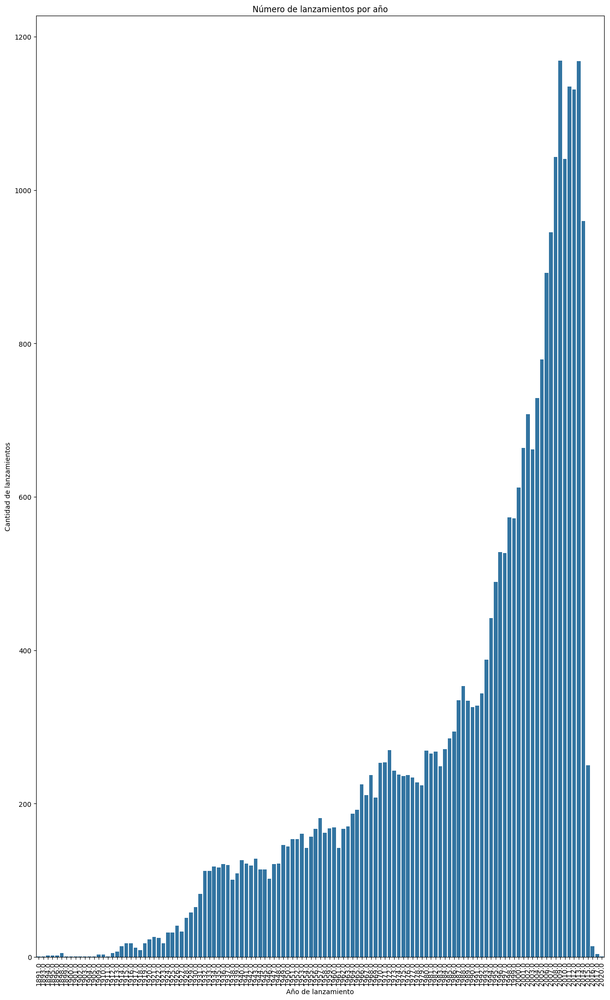

In [14]:
release_year_counts = data['release_year'].value_counts().sort_index()

plt.figure(figsize=(15, 25))

sns.barplot(x=release_year_counts.index, y=release_year_counts.values)

plt.title('Número de lanzamientos por año')
plt.xlabel('Año de lanzamiento')
plt.ylabel('Cantidad de lanzamientos')

plt.xticks(rotation=90)

plt.show()

El cine creció sin parar durante cien años (si lo consideramos con la cantidad de pelis estrenadas por año)

vemos que a partir de 2014 hay una caida en los estrenos por año, volviendo a  valores similares a los 70/80 (si consideráramos la cantidad de cines en los 80 vs en 2014/2015 podría entenderse mejor este dato)

Cuando màs estrenos hubo en toda la historia, fue en 2009 (cuántos?).

En 2016 y 2017 ya tiene valores similares a los de 1920/30? Esto puede deberse a que el cine migró a plataformas.
en pandemia sabemos que no hubo salas casi durante todo el año.

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\209614112.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=top_5_combined.index, y=top_5_combined.values, palette="viridis")


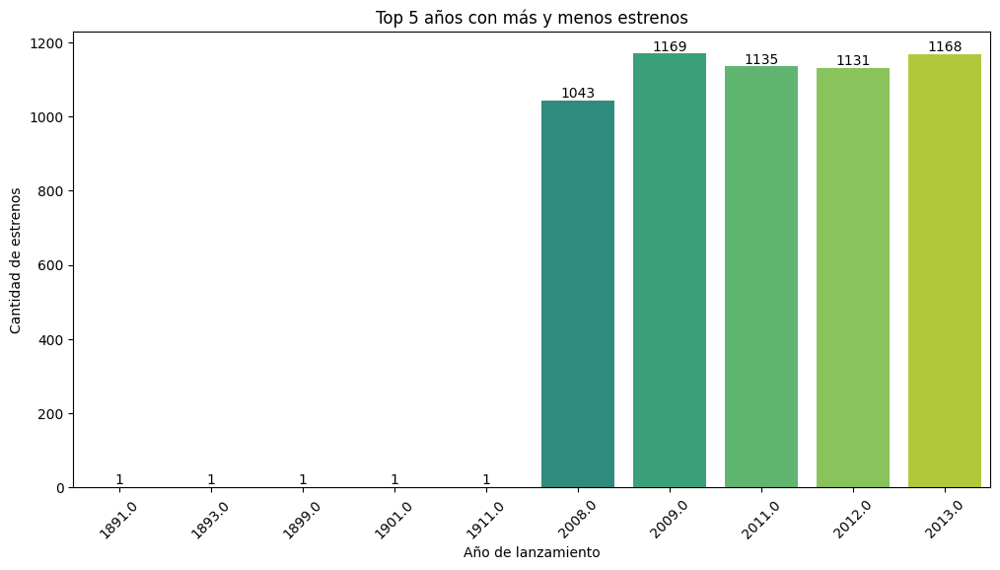

In [65]:
release_year_counts = data['release_year'].value_counts().sort_values(ascending=False)

top_5_years_most = release_year_counts.head(5)
top_5_years_least = release_year_counts.tail(5)
top_5_combined = pd.concat([top_5_years_most, top_5_years_least])

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_5_combined.index, y=top_5_combined.values, palette="viridis")

# Añado los valores dentro de las barras
for i in ax.containers:
    ax.bar_label(i, label_type='edge', fontsize=10, color='black')

plt.title('Top 5 años con más y menos estrenos')
plt.xlabel('Año de lanzamiento')
plt.ylabel('Cantidad de estrenos')
plt.xticks(rotation=45)

plt.show()

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\1752114774.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=release_year_counts.index, y=release_year_counts.values, palette="viridis")


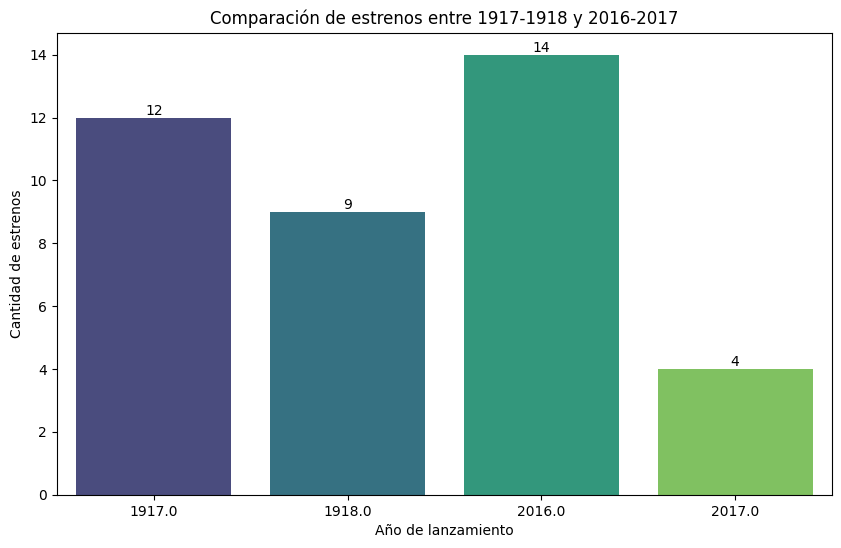

In [66]:
filtered_data = data[data['release_year'].isin([1917, 1918, 2016, 2017])]

release_year_counts = filtered_data['release_year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
ax = sns.barplot(x=release_year_counts.index, y=release_year_counts.values, palette="viridis")

for i in ax.containers:
    ax.bar_label(i, label_type='edge', fontsize=10, color='black')

plt.title('Comparación de estrenos entre 1917-1918 y 2016-2017')
plt.xlabel('Año de lanzamiento')
plt.ylabel('Cantidad de estrenos')

plt.show()


es extraño que en 2017 haya habido 4 estrenos

Según el anuario de INCAA, que puede descargarse online, que presenta, además de los datos cuantitativos de la asistencia a las salas, dice que en Argentina (en 2017) se estrenaron 473 largometrajes.
Esto me permite llegar a la conclusión de que los datos están mal.

Voy a trabajar con otro campo que no sea cantidad de estrenos

In [15]:
print(data.head())
print(data.describe())
print(data.info())

      id      budget                                           overview  \
0    862  30000000.0  Led by Woody, Andy's toys live happily in his ...   
1   8844  65000000.0  When siblings Judy and Peter discover an encha...   
2  15602         0.0  A family wedding reignites the ancient feud be...   
3  31357  16000000.0  Cheated on, mistreated and stepped on, the wom...   
4  11862         0.0  Just when George Banks has recovered from his ...   

  popularity release_date      revenue  runtime  \
0  21.946943   1995-10-30  373554033.0     81.0   
1  17.015539   1995-12-15  262797249.0    104.0   
2    11.7129   1995-12-22          0.0    101.0   
3   3.859495   1995-12-22   81452156.0    127.0   
4   8.387519   1995-02-10   76578911.0    106.0   

                                             tagline  \
0                                                NaN   
1          Roll the dice and unleash the excitement!   
2  Still Yelling. Still Fighting. Still Ready for...   
3  Friends are the

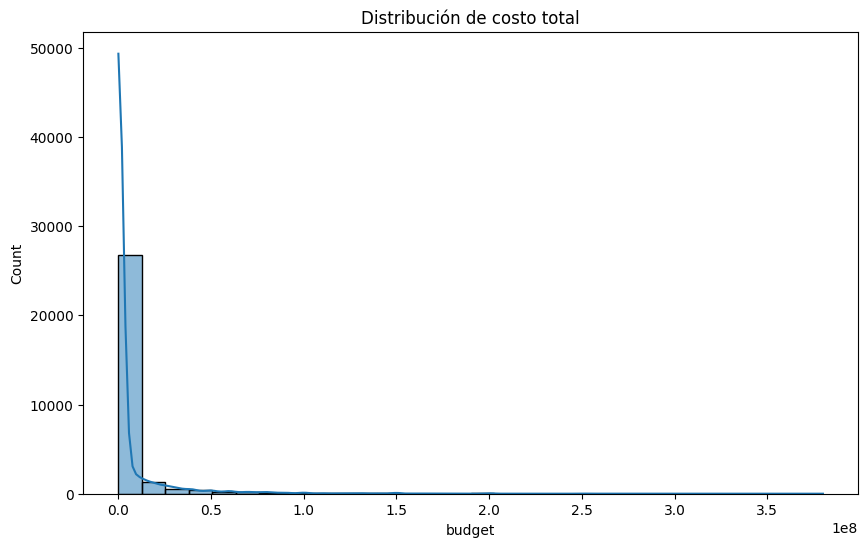

In [16]:
# Histograma de budget
plt.figure(figsize=(10, 6))
sns.histplot(data['budget'], bins=30, kde=True)
plt.title('Distribución de costo total')

plt.show()

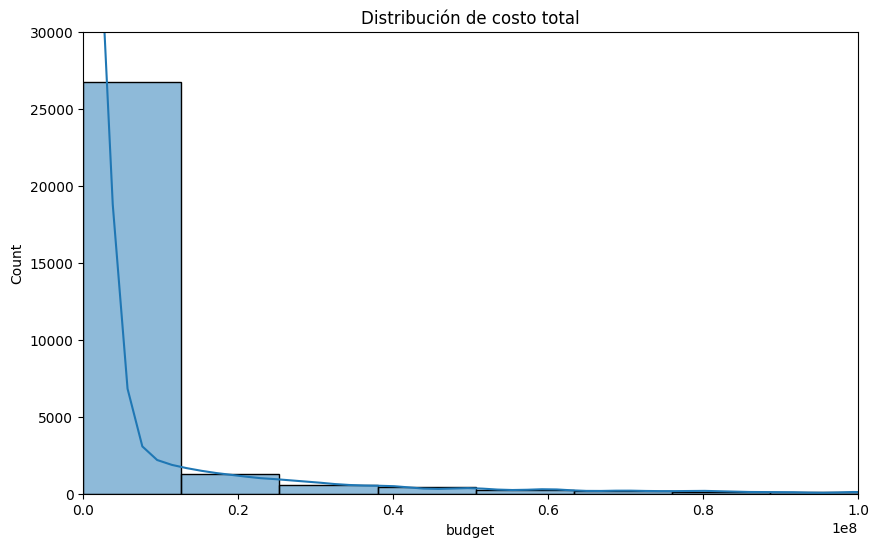

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(data['budget'], bins=30, kde=True)
plt.title('Distribución de costo total')
plt.xlim(0, 1e8)
plt.ylim(0, 30000)
plt.show()

Los valores de la primera columna son outliers, en realidad corresponden a los budget que desconocen y colocan 0. 

In [18]:
#voy a generar un df con la columna budget que no son 0, así puedo evaluar mejor esta relación
df_budget =  data[data['budget'] != 0]

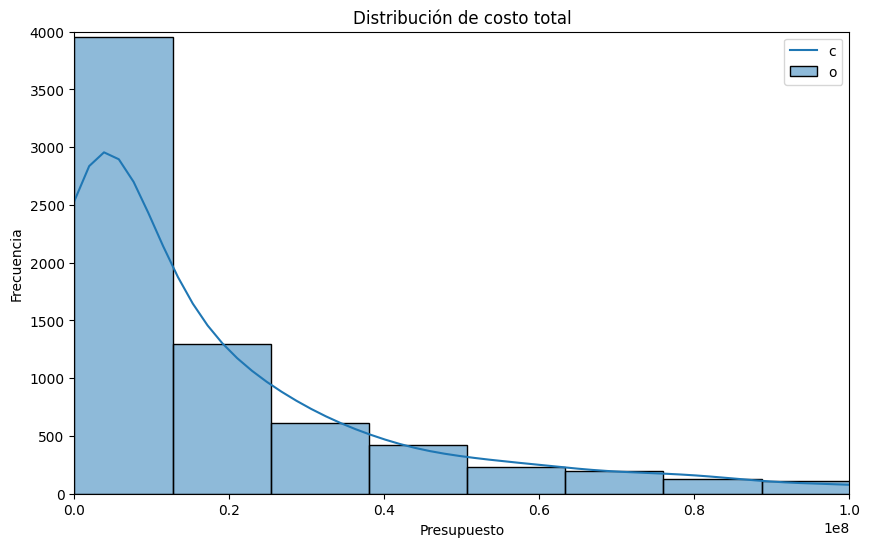

In [19]:
plt.figure(figsize=(10, 6))
sns.histplot(df_budget['budget'], bins=30, kde=True, label='Costos de películas')
plt.title('Distribución de costo total')
plt.xlabel('Presupuesto')
plt.ylabel('Frecuencia')
plt.xlim(0, 100e6)
plt.ylim(0, 4000)
plt.legend('costos por películas en millones') 
plt.show()

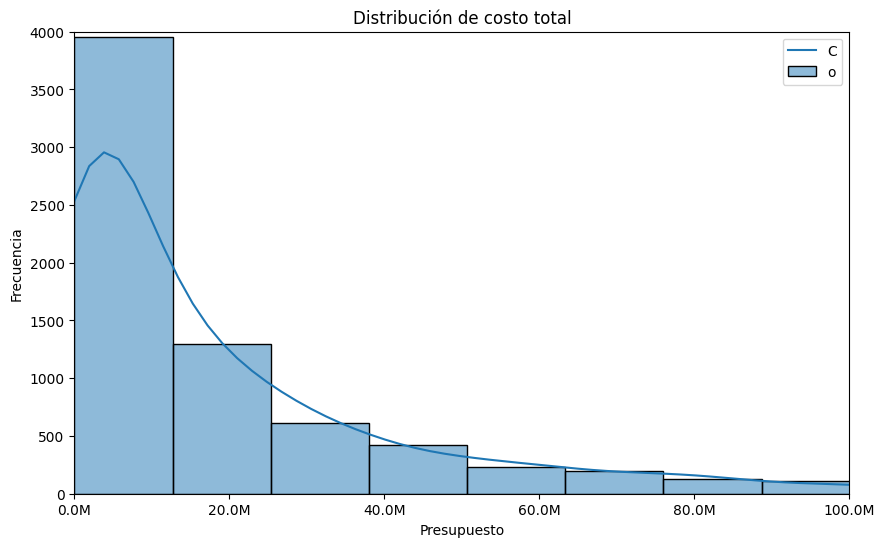

In [20]:
from matplotlib.ticker import FuncFormatter
# Función para formatear las etiquetas del eje x
def millions(x, pos):
    'The two args are the value and tick position'
    return '%1.1fM' % (x * 1e-6)

formatter = FuncFormatter(millions)

# Crear el histograma con la leyenda
plt.figure(figsize=(10, 6))
sns.histplot(df_budget['budget'], bins=30, kde=True, label='Costos de películas')
plt.title('Distribución de costo total')
plt.xlabel('Presupuesto')
plt.ylabel('Frecuencia')
plt.xlim(0, 1e8)
plt.ylim(0, 4000)
plt.legend("Costo de realización de las películas") 

plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

In [21]:

# Convertir las columnas 'budget' y 'popularity' a numéricas, forzando los no numéricos a NaN
data['budget'] = pd.to_numeric(data['budget'], errors='coerce')
data['popularity'] = pd.to_numeric(data['popularity'], errors='coerce')

# Ver el DataFrame después de la conversión
print("DataFrame después de la conversión a numérico:")
#print(data)

# Eliminar filas con valores NaN en las columnas 'budget' y 'popularity'
data_corr = data[['budget', 'popularity']].dropna()

# Ver el DataFrame después de eliminar NaN
print("DataFrame después de eliminar NaN:")
print(data_corr.head())

# Calcular la matriz de correlación
correlation = data_corr.corr()
print("Matriz de correlación:")
print(correlation)

DataFrame después de la conversión a numérico:
DataFrame después de eliminar NaN:
       budget  popularity
0  30000000.0   21.946943
1  65000000.0   17.015539
2         0.0   11.712900
3  16000000.0    3.859495
4         0.0    8.387519
Matriz de correlación:
              budget  popularity
budget      1.000000    0.500696
popularity  0.500696    1.000000


In [22]:
(data_corr["budget"]== 0).sum()

22761

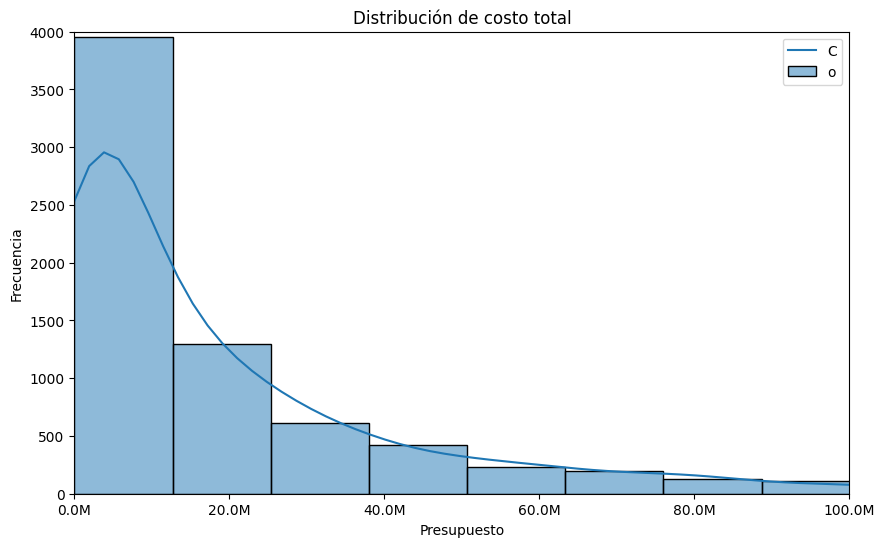

In [23]:
def millions(x, pos):
    'The two args are the value and tick position'
    return '%1.1fM' % (x * 1e-6)

formatter = FuncFormatter(millions)

# Crear el histograma con la leyenda
plt.figure(figsize=(10, 6))
sns.histplot(df_budget['budget'], bins=30, kde=True, label='Costos de películas')
plt.title('Distribución de costo total')
plt.xlabel('Presupuesto')
plt.ylabel('Frecuencia')
plt.xlim(0, 1e8)
plt.ylim(0, 4000)
plt.legend("Costo de realización de las películas") 

plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

In [24]:
data['budget'] = pd.to_numeric(data['budget'], errors='coerce')
data['popularity'] = pd.to_numeric(data['popularity'], errors='coerce')

# Elimino NaN de 'budget' y 'popularity'
data = data[['budget', 'popularity']].dropna()

# Filtro filas para 'budget' mayor a cero
data_corr = data[data['budget'] > 0]

correlation = data_corr.corr()
print("\nMatriz de correlación:")
print(correlation)


Matriz de correlación:
              budget  popularity
budget      1.000000    0.418555
popularity  0.418555    1.000000


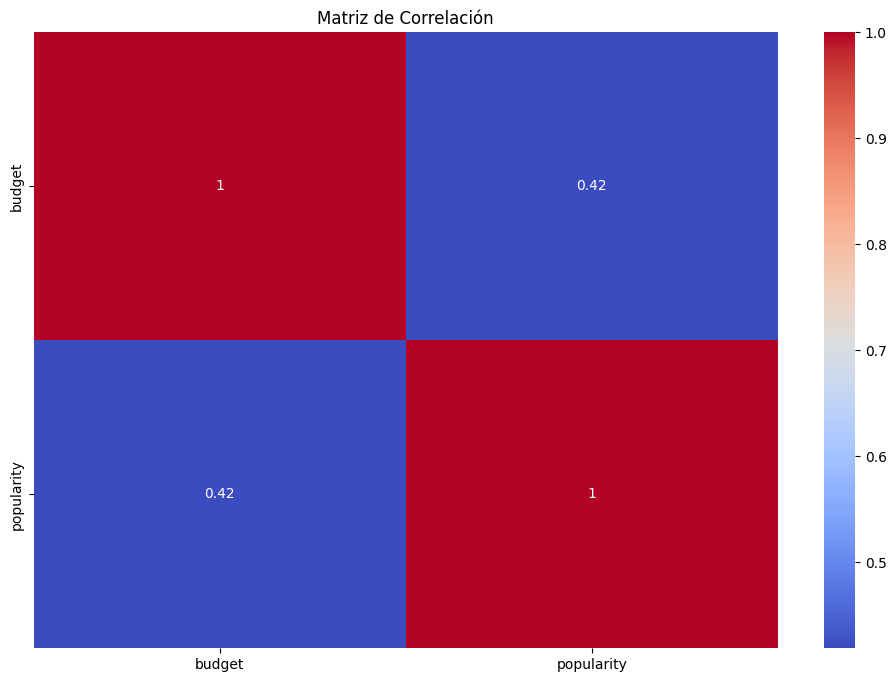

In [25]:
plt.figure(figsize=(12, 8))
correlation_matrix = data_corr.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación')
plt.show()

In [26]:
data = pd.read_csv("../dataset/df_completo.csv")
data.drop(["Unnamed: 0", "ID", "index"], axis=1, inplace=True)
data.drop(["status"], axis=1, inplace=True)
cols = list(data.columns)
cols.insert(0, cols.pop(1))
data = data[cols]
data=data.truncate(before= 0, after=30001)

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\3952633563.py:1: DtypeWarning: Columns (4,16,17,18,19,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../dataset/df_completo.csv")


In [27]:
data['return'] = pd.to_numeric(data['return'], errors='coerce')
data['popularity'] = pd.to_numeric(data['popularity'], errors='coerce')

# Elimino NaN de 'return' y 'popularity'
data = data[['return', 'popularity']].dropna()

# Filtro filas para 'return' que no sea cero
data_corr = data[data['return'] != 0]

correlation2 = data_corr.corr()
print("\nMatriz de correlación 2:")
print(correlation2)


Matriz de correlación 2:
              return  popularity
return      1.000000   -0.012482
popularity -0.012482    1.000000


In [28]:
#esto era impredecible para mí

In [29]:
data.dtypes


return        float64
popularity    float64
dtype: object

In [30]:
data = pd.read_csv("../dataset/df_completo.csv")
data.drop(["Unnamed: 0", "ID", "index"], axis=1, inplace=True)
data.drop(["status"], axis=1, inplace=True)
cols = list(data.columns)
cols.insert(0, cols.pop(1))
data = data[cols]
data=data.truncate(before= 0, after=30001)

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\3952633563.py:1: DtypeWarning: Columns (4,16,17,18,19,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../dataset/df_completo.csv")


In [31]:
data["genres 1"].isnull().sum()
data["genres 1"].dtypes

dtype('O')

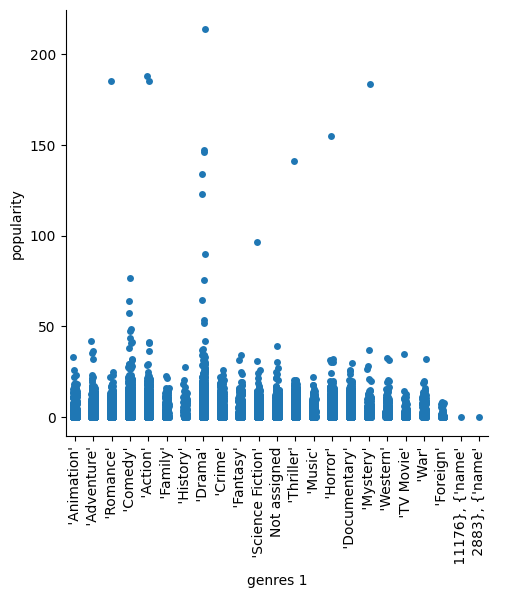

In [32]:
ty = sns.catplot(data=data, x= "genres 1", y="popularity")
ty.set_xticklabels(rotation=90)


Drama accion y comedia presentan las 3 correlaciones mas grandes con popularidad.
graficar top 5 en horizontal 

ahora veo la cantidad de películas segun el genero

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\3842695670.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\3842695670.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\3842695670.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)


[Text(0.0, 0, '0'),
 Text(2500.0, 0, '2500'),
 Text(5000.0, 0, '5000'),
 Text(7500.0, 0, '7500'),
 Text(10000.0, 0, '10000'),
 Text(12500.0, 0, '12500'),
 Text(15000.0, 0, '15000'),
 Text(17500.0, 0, '17500'),
 Text(20000.0, 0, '20000'),
 Text(22500.0, 0, '22500')]

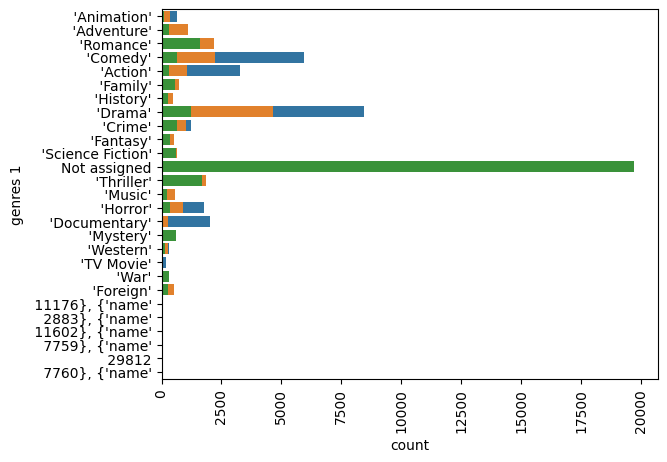

In [33]:
ty1 = sns.countplot(data["genres 1"])
ty2 = sns.countplot(data["genres 2"])
ty3 = sns.countplot(data["genres 3"])
ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)

#me falta mostrar que cada color corresponde a genero principal, secundario y terciario
#y decido ignorar los not assigned.

veo que hay valores que no corresponden a genero que estan en esta columna

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\4002438555.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\4002438555.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\4002438555.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label sta

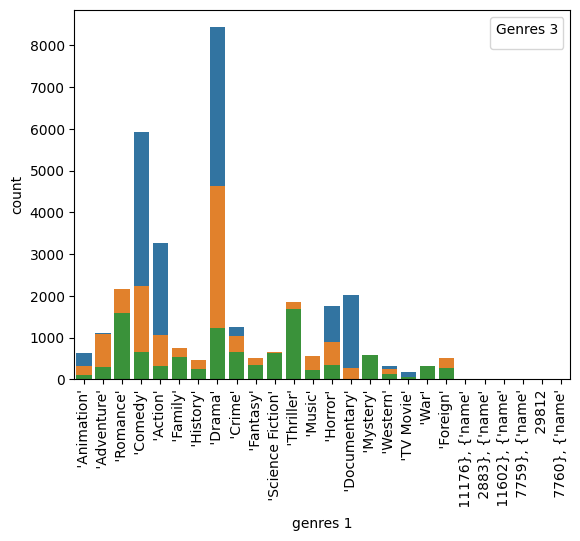

In [34]:

ty1 = sns.countplot(data=data[data["genres 1"] != "Not assigned"], x="genres 1")
ty2 = sns.countplot(data=data[data["genres 2"] != "Not assigned"], x="genres 2")
ty3 = sns.countplot(data=data[data["genres 3"] != "Not assigned"], x="genres 3")

# Configurar las etiquetas en el eje x
ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)

# Añadir leyendas
ty1.legend(title="Genres 1")
ty2.legend(title="Genres 2")
ty3.legend(title="Genres 3")

# Mostrar los gráficos
plt.show()


In [35]:
erroneous_values = ["'11176},{'name'","'2883},{'name'", "'11602},{name'","'7759},{'name'",29812,"'7760},{'name'"]
data['genres 1'] = data['genres 1'].str.strip()
data['genres 2'] = data['genres 2'].str.strip()
data['genres 3'] = data['genres 3'].str.strip()
data['genres 1'] = data['genres 1'].replace(erroneous_values,'Not assigned')
data['genres 2'] = data['genres 2'].replace(erroneous_values,'Not assigned')
data['genres 3'] = data['genres 3'].replace(erroneous_values,'Not assigned')

C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\1455450045.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\1455450045.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
C:\Users\Agustin\AppData\Local\Temp\ipykernel_1316\1455450045.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)


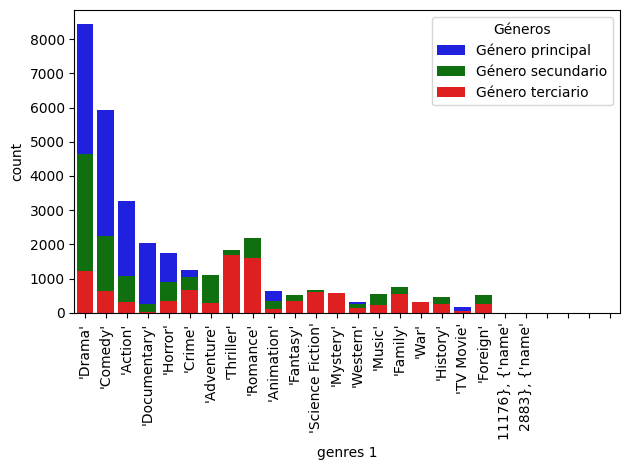

In [36]:
df1 = data[data["genres 1"] != "Not assigned"]
df2 = data[data["genres 2"] != "Not assigned"]
df3 = data[data["genres 3"] != "Not assigned"]

ty1 = sns.countplot(data=df1, x="genres 1", order = df1['genres 1'].value_counts().index, color='blue', label='Género principal')
ty1.set_xticklabels(ty1.get_xticklabels(), rotation=90)
ty1.legend(title="Géneros")

ty2 = sns.countplot(data=df2, x="genres 2", order = df2["genres 2"].value_counts().index, color='green', label='Género secundario')
ty2.set_xticklabels(ty2.get_xticklabels(), rotation=90)
ty2.legend(title="Géneros")

ty3 = sns.countplot(data=df3 , x="genres 3", order = df3["genres 3"].value_counts().index, color='red', label='Género terciario')
ty3.set_xticklabels(ty3.get_xticklabels(), rotation=90)
ty3.legend(title="Géneros")

plt.tight_layout()
plt.show()


El drama la comedia y la acción son los géneros que dominan.
Querrìa ver si el gènero y la popularidad estan correlacionados


In [37]:
data_corr3 =  data_corr = data[['return', 'budget']]

In [38]:

data_corr3.corr()


,return,budget
return,1.000000,-0.003088
budget,-0.003088,1.000000


extraño

In [39]:
data.columns

Index(['id', 'budget', 'overview', 'popularity', 'release_date', 'revenue',
       'runtime', 'tagline', 'title', 'vote_average', 'vote_count',
       'release_year', 'return', 'Main_spoken_languages',
       'belongs_to_collection.3.1', 'genres 1', 'genres 2', 'genres 3', 'Cast',
       'Directed by'],
      dtype='object')

In [40]:
data_corr4 =  data_corr = data[['popularity', 'vote_average']]
data_corr4.corr()

,popularity,vote_average
popularity,1.000000,0.189485
vote_average,0.189485,1.000000


otra corelación que no tiene sentido, para mí

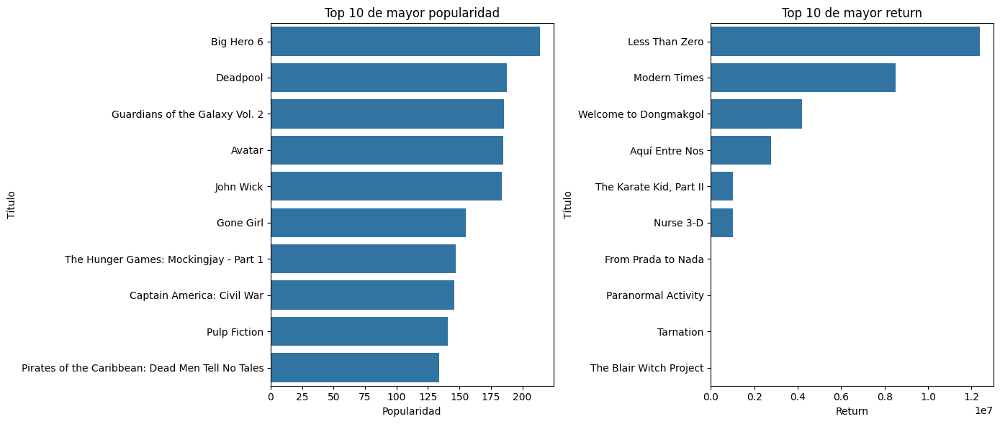

In [61]:
top_10_popularity = data.sort_values(by='popularity', ascending=False).head(10)
top_10_return = data.sort_values(by='return', ascending=False).head(10)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.barplot(x='popularity', y='title', data=top_10_popularity)
plt.title('Top 10 de mayor popularidad')
plt.xlabel('Popularidad')
plt.ylabel('Título')

plt.subplot(1, 2, 2)
sns.barplot(x='return', y='title', data=top_10_return)
plt.title('Top 10 de mayor return')
plt.xlabel('Return')
plt.ylabel('Título')

plt.tight_layout()
plt.show()

Otra vez veo que no hay relacion entre popularidad y return.

In [42]:
#pip install wordcloud

In [43]:
from wordcloud import WordCloud, ImageColorGenerator

In [44]:
import nltk

In [45]:
data["overview"]

0        Led by Woody, Andy's toys live happily in his ...
1        When siblings Judy and Peter discover an encha...
2        A family wedding reignites the ancient feud be...
3        Cheated on, mistreated and stepped on, the wom...
4        Just when George Banks has recovered from his ...
                               ...                        
29997    Professor Sretenski is a scientist and directo...
29998    "I Am Walking Along Moscow" aka "Ya Shagayu Po...
29999    Benjamin, the local doctor is a soul of a loca...
30000    St. Petersburg, mid 19th century: the indolent...
30001    Romm's "Ordinary Fascism" pulls out all the st...
Name: overview, Length: 30002, dtype: object

In [46]:
print(data["overview"].isnull().sum())

325


In [47]:
data["tagline"]

0                                                      NaN
1                Roll the dice and unleash the excitement!
2        Still Yelling. Still Fighting. Still Ready for...
3        Friends are the people who let you be yourself...
4        Just When His World Is Back To Normal... He's ...
                               ...                        
29997                                                  NaN
29998                                                  NaN
29999                                                  NaN
30000                                                  NaN
30001                                                  NaN
Name: tagline, Length: 30002, dtype: object

In [48]:
print(data["tagline"].isnull().sum())

14108


In [49]:
#eliminar las stopwords del overview

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


In [50]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Agustin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Agustin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [51]:
df_c = data.copy()

In [52]:
df_c['overview'] = df_c['overview'].fillna('').astype(str)
df_c['tagline'] = df_c['tagline'].fillna('').astype(str)
df_c['combined'] = data['overview'] + data['tagline']


In [53]:
stop_words = set(stopwords.words('english'))

def remove_stop_words(text):
    if isinstance(text, str):
        words = word_tokenize(text)
        filtered_words = [word for word in words if word.lower() not in stop_words]
        return ' '.join(filtered_words)
    return ''

df_c['filtered'] = df_c['combined'].apply(remove_stop_words)

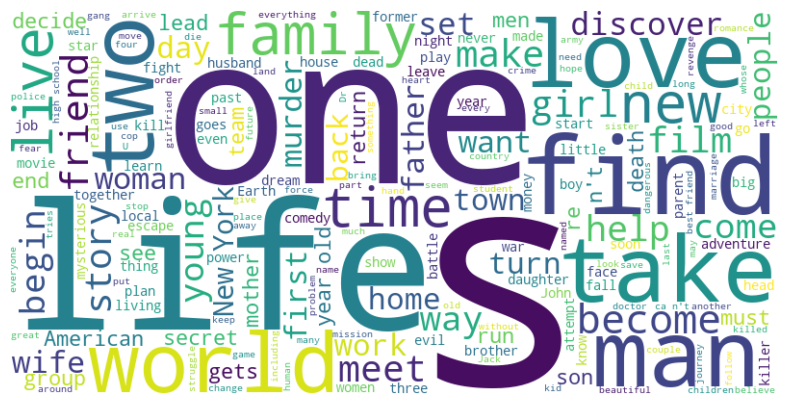

In [54]:
combined_text = ' '.join(df_c['filtered'])

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [55]:
#puedo asociar palabras a géneros? a puntaje?
# Crear un diccionario para mapear palabras a categorías
df_cg=data.copy()
df_cg['overview'] = df_cg['overview'].fillna('').astype(str)
df_cg['tagline'] = df_cg['tagline'].fillna('').astype(str)
df_cg['combined'] = df_cg['overview'] + df_cg['tagline']


In [56]:
def tokenize_and_filter(text):
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text.lower())
    return [word for word in words if word.isalpha() and word not in stop_words]

# Aplicar la función al texto
df_cg['tokens'] = df_cg['combined'].apply(tokenize_and_filter)

from collections import defaultdict

# Crear un diccionario para mapear palabras a categorías y contar su frecuencia
word_to_category_count = defaultdict(lambda: defaultdict(int))

for _, row in df_cg.iterrows():
    category = row['genres 1']
    for word in row['tokens']:
        word_to_category_count[word][category] += 1

# Mostrar el diccionario con palabras, categorías y sus frecuencias
for word, categories in word_to_category_count.items():
    print(f'Palabra: {word}')
    for category, count in categories.items():
        print(f'  Categoría: {category}, Frecuencia: {count}')


Palabra: led
  Categoría: 'Animation', Frecuencia: 7
  Categoría: Not assigned, Frecuencia: 13
  Categoría: 'Action', Frecuencia: 60
  Categoría: 'Drama', Frecuencia: 81
  Categoría: 'Adventure', Frecuencia: 13
  Categoría: 'Documentary', Frecuencia: 28
  Categoría: 'Western', Frecuencia: 4
  Categoría: 'Comedy', Frecuencia: 60
  Categoría: 'Science Fiction', Frecuencia: 5
  Categoría: 'Romance', Frecuencia: 10
  Categoría: 'Thriller', Frecuencia: 15
  Categoría: 'Horror', Frecuencia: 18
  Categoría: 'Fantasy', Frecuencia: 4
  Categoría: 'Music', Frecuencia: 3
  Categoría: 'Crime', Frecuencia: 13
  Categoría: 'Mystery', Frecuencia: 3
  Categoría: 'Family', Frecuencia: 1
  Categoría: 'History', Frecuencia: 4
  Categoría: 'War', Frecuencia: 6
  Categoría: 'TV Movie', Frecuencia: 4
Palabra: woody
  Categoría: 'Animation', Frecuencia: 3
  Categoría: 'Adventure', Frecuencia: 3
  Categoría: 'Action', Frecuencia: 10
  Categoría: 'Drama', Frecuencia: 10
  Categoría: Not assigned, Frecuencia: 1